Importing the modules

# Welcome to the notebook 🙂

### Task 1 - Importing the Dataset

In [15]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

Modules are imported!


In [17]:
data = pd.read_csv("Creditcard_dataset.csv")
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Check the data shape

In [18]:
data.shape

(50492, 31)

Let's see how many genuine and limited fraudulent records we have

In [19]:
data.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [20]:
data.dropna(inplace=True)
data.shape

(50492, 31)

Removing Time column

In [21]:
data = data.drop(axis = 1, columns = 'Time')
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column

In [22]:
scaler = StandardScaler()
data['Amount'] = scaler.fit_transform(data[['Amount']])
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [23]:
data_fraud = data[data.Class == 1]
data_genuine = data[data.Class == 0]
data_fraud

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
50000,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,...,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,-0.372497,1
50001,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,...,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,1.866017,1
50002,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,-1.525412,...,-0.294166,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,0.642790,1
50003,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,...,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,-0.122833,1
50004,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,...,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,-0.368265,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,1
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,1
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,1
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,1


Split the data into features and labels

In [24]:
X = data.drop("Class", axis = 1)
y = data.Class

Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [25]:
pca = PCA(2)
transformed_data = pca.fit_transform(X)
df = pd.DataFrame(transformed_data)
df['label'] = y
df

,0,1,label
0,-0.447837,1.197431,0
1,-0.582390,0.257935,0
2,-0.939391,-0.728293,0
3,-0.630765,-0.499128,0
4,-0.536285,-1.055428,0
...,...,...,...
50487,10.855755,-2.787395,1
50488,6.927754,-4.949704,1
50489,7.038194,-2.785127,1
50490,11.649181,-1.991772,1


Let's Use a scatter plot to visualize our data

In [27]:
px.scatter(df , x = 0, y = 1, color = df.label.astype(str))


### Task 3 - Building the Generator Model

Write a method to create the Generator model architecture

In [51]:
def build_generator():
    model = Sequential ()
    model.add(Dense(32, activation = 'relu', input_dim = 29, kernel_initializer = 'he_uniform'))
    model.add(BatchNormalization())
    
    model.add(Dense(64, activation = 'relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(128, activation = 'relu'))
    model.add(BatchNormalization())
    
    model.add(Dense(29, activation = 'linear'))
    model.summary()
    
    return model 
build_generator()


Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_100 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_30 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_101 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_31 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_102 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_32 (Bat  (None, 128)            

### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [35]:
def build_discriminator():
    model = Sequential()
    model.add(Dense(120, input_dim = 29, activation = 'relu', kernel_initializer = 'he_uniform'))
    
    model.add(Dense(64, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(32, activation = 'relu'))
    model.add(Dense(16, activation = 'relu'))
    
    model.add(Dense(1, activation = 'sigmoid'))
    model.compile(optimizer = 'adam', loss = 'binary_crossentropy')
    model.summary()
    return model

build_discriminator()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 120)               3600      
                                                                 
 dense_25 (Dense)            (None, 64)                7744      
                                                                 
 dense_26 (Dense)            (None, 32)                2080      
                                                                 
 dense_27 (Dense)            (None, 32)                1056      
                                                                 
 dense_28 (Dense)            (None, 16)                528       
                                                                 
 dense_29 (Dense)            (None, 1)                 17        
                                                                 
Total params: 15,025
Trainable params: 15,025
Non-trai

### Task 5 - Combine Generator and Discriminator models to Build The GAN

In [43]:
def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = Input(shape = (generator.input_shape[1],))
    x = generator(gan_input)
    
    gan_output = discriminator(x)
    gan = Model(gan_input, gan_output)
    gan.summary()
    return gan

Let's create a method that generates synthetic data using the Generator

In [46]:
def generate_synthetic_data(generator, num_samples):
    noise = np.random.normal(0,1,(num_samples, generator.input_shape[1]))
    fake_Data = generator.predict(noise)
    return fake_Data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [38]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_114 (Dense)           (None, 32)                960       
                                                                 
 batch_normalization_36 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_115 (Dense)           (None, 64)                2112      
                                                                 
 batch_normalization_37 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_116 (Dense)           (None, 128)               8320      
                                                                 
 batch_normalization_38 (Bat  (None, 128)            

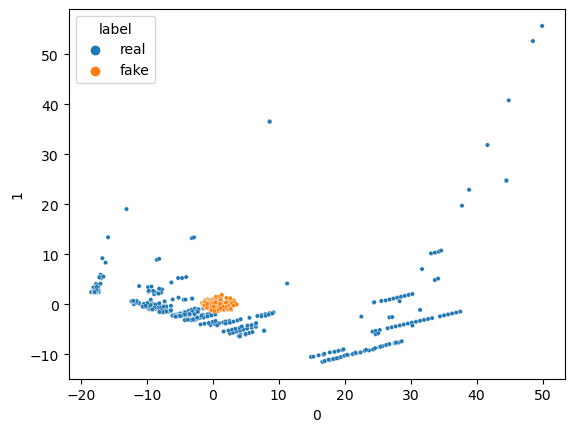

16/16 [==============================] - 0s 869us/step


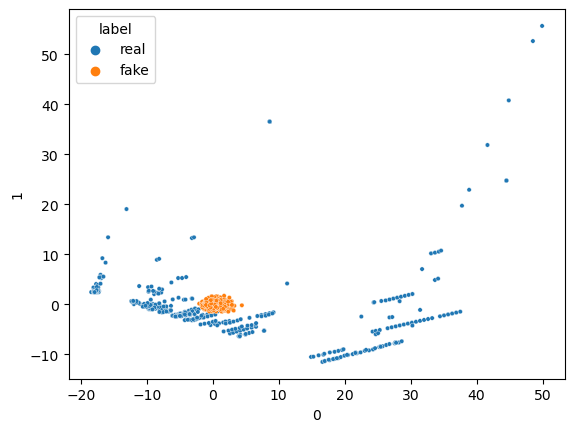

16/16 [==============================] - 0s 6ms/step


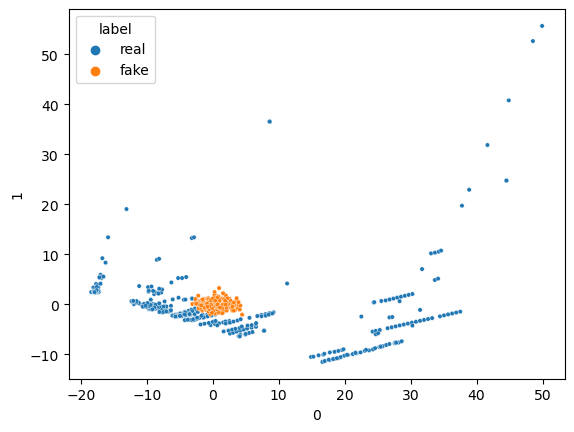

16/16 [==============================] - 0s 6ms/step


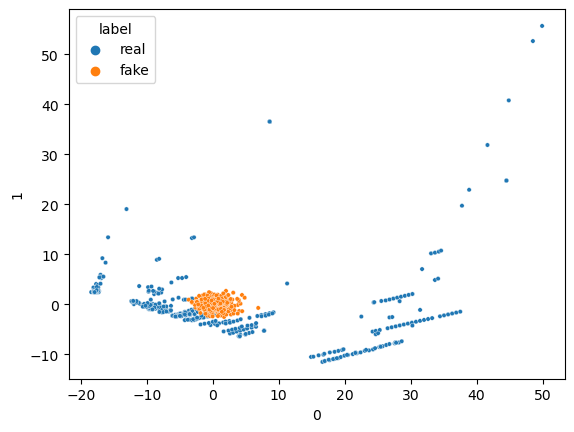

16/16 [==============================] - 0s 6ms/step


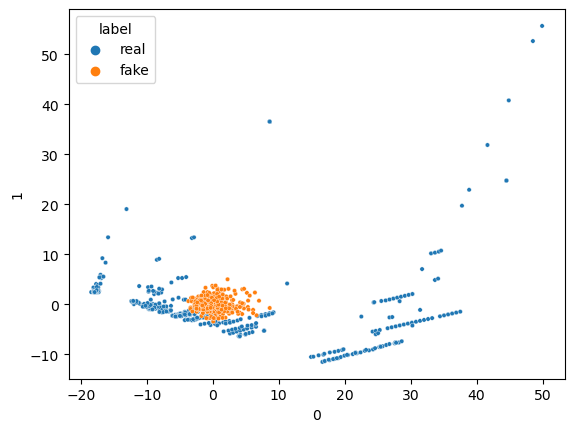

16/16 [==============================] - 0s 897us/step


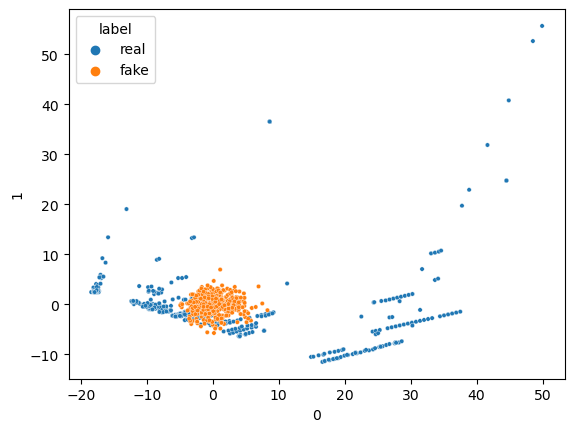

16/16 [==============================] - 0s 788us/step


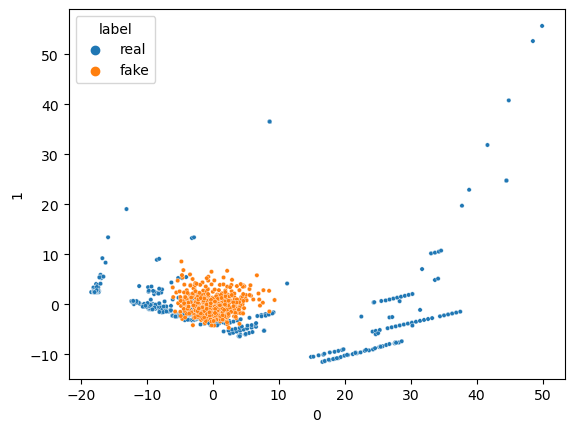

16/16 [==============================] - 0s 6ms/step


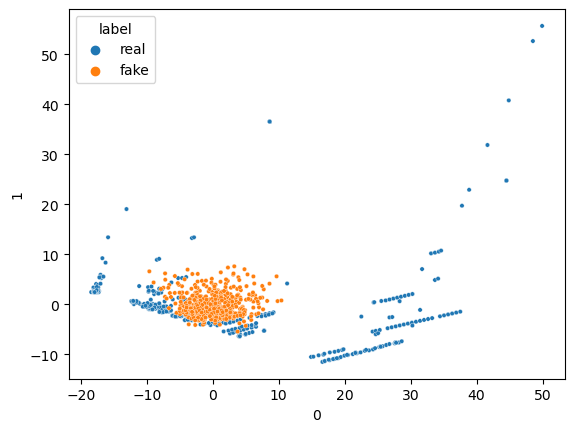

16/16 [==============================] - 0s 6ms/step


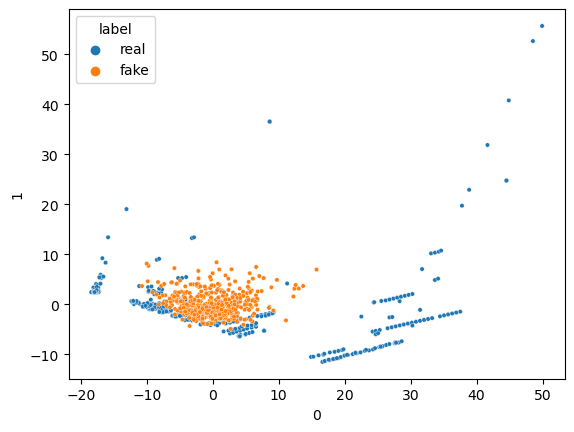

16/16 [==============================] - 0s 756us/step


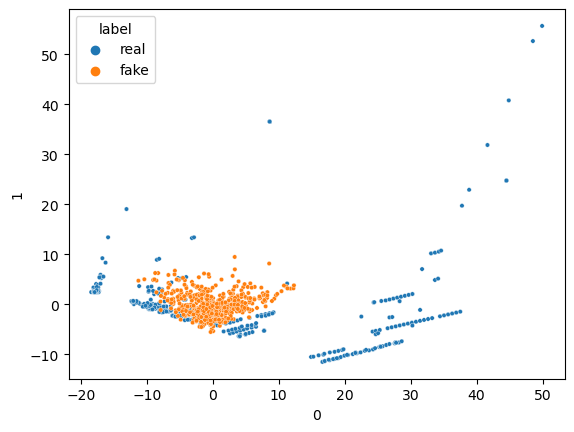

16/16 [==============================] - 0s 6ms/step


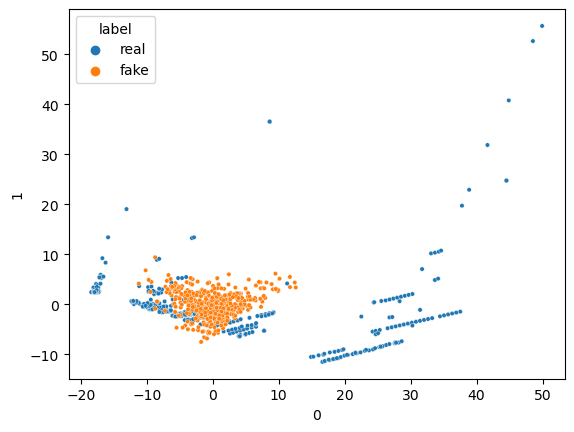

16/16 [==============================] - 0s 6ms/step


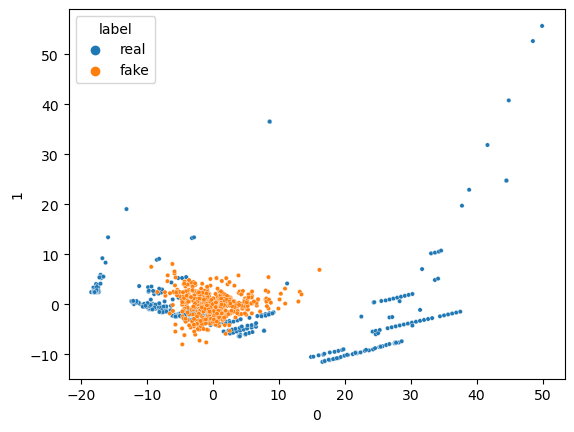

16/16 [==============================] - 0s 6ms/step


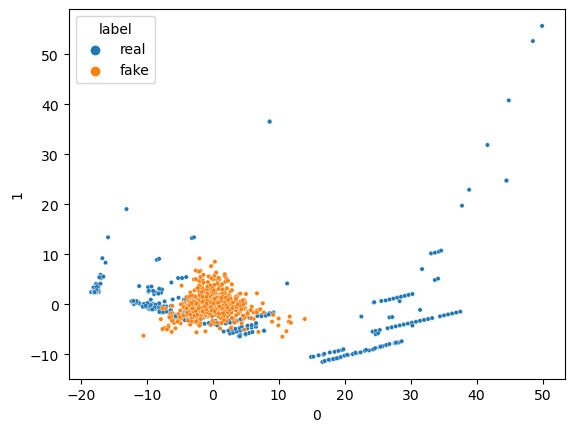

16/16 [==============================] - 0s 6ms/step


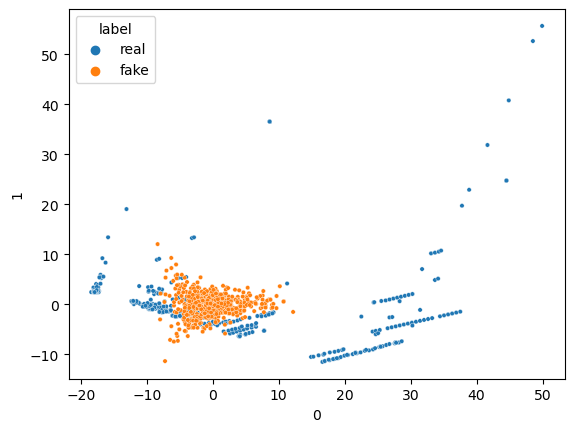

16/16 [==============================] - 0s 6ms/step


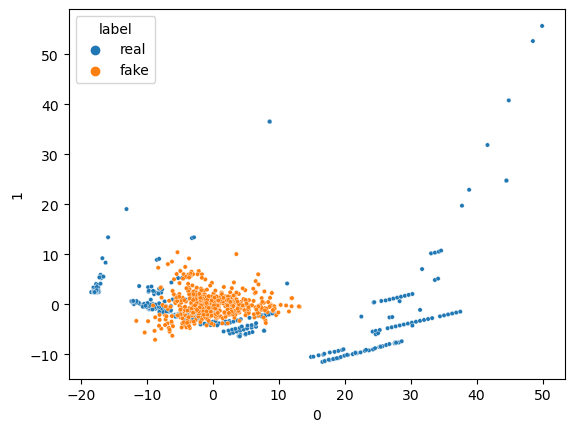

16/16 [==============================] - 0s 6ms/step


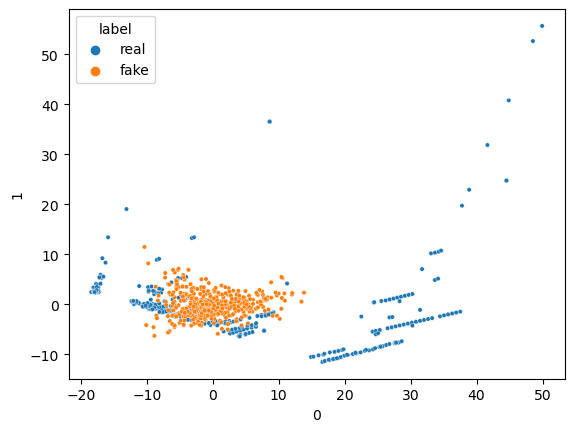

16/16 [==============================] - 0s 6ms/step


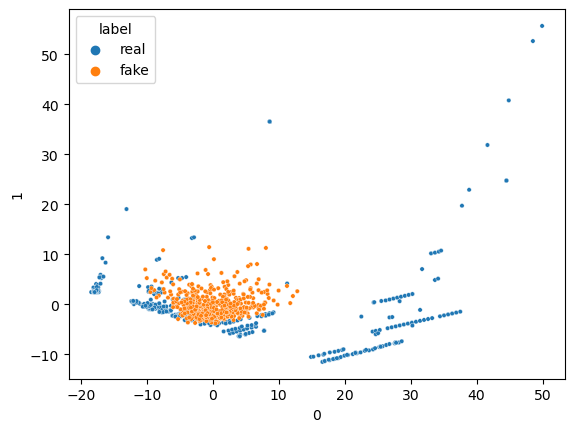

16/16 [==============================] - 0s 812us/step


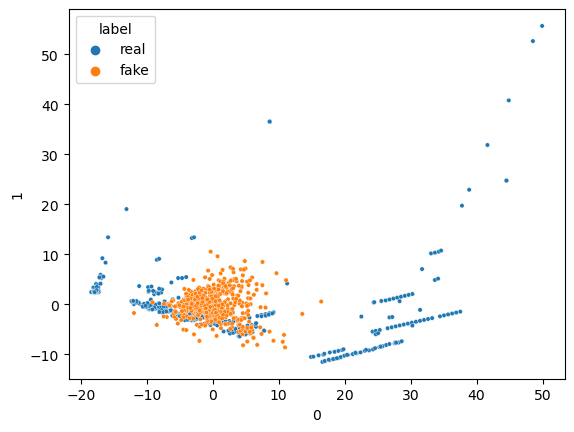

16/16 [==============================] - 0s 6ms/step


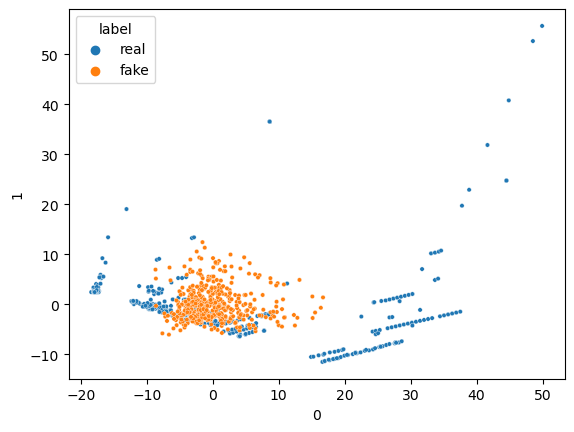

16/16 [==============================] - 0s 6ms/step


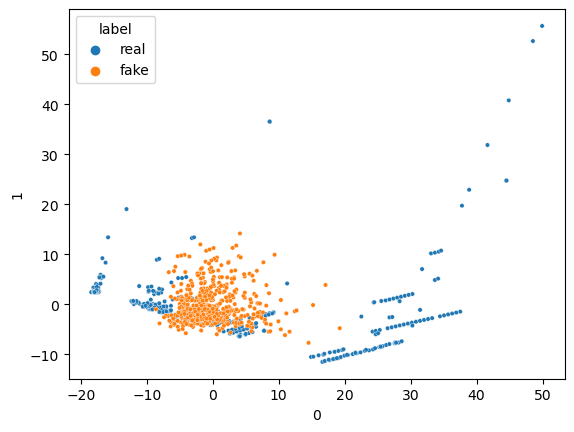

16/16 [==============================] - 0s 894us/step


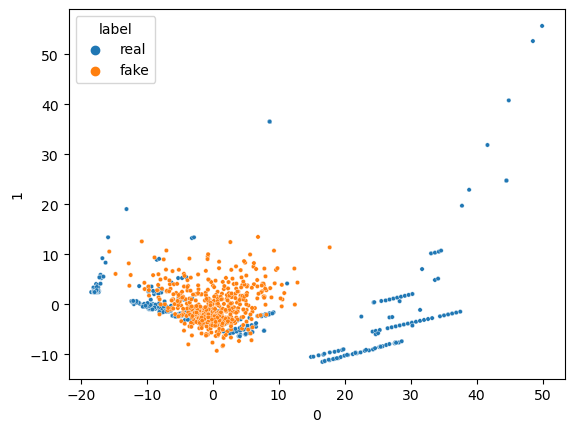

16/16 [==============================] - 0s 786us/step


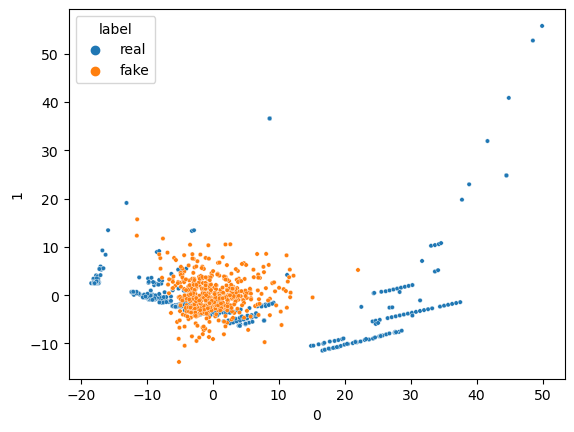

16/16 [==============================] - 0s 6ms/step


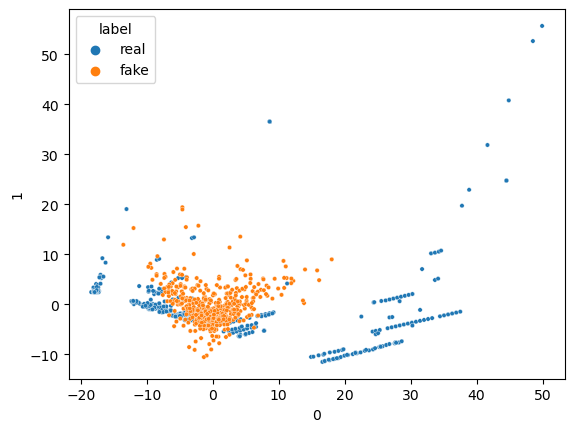

16/16 [==============================] - 0s 6ms/step


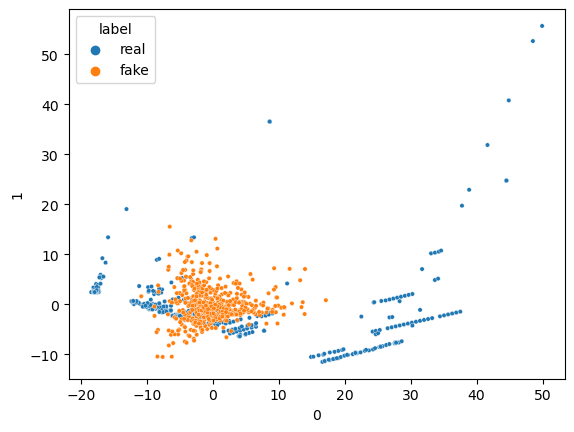

16/16 [==============================] - 0s 6ms/step


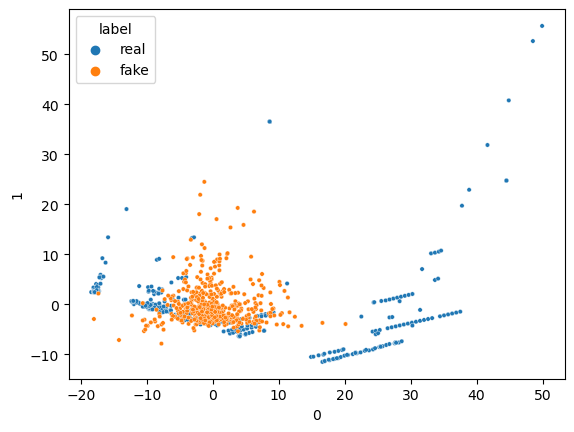

16/16 [==============================] - 0s 803us/step


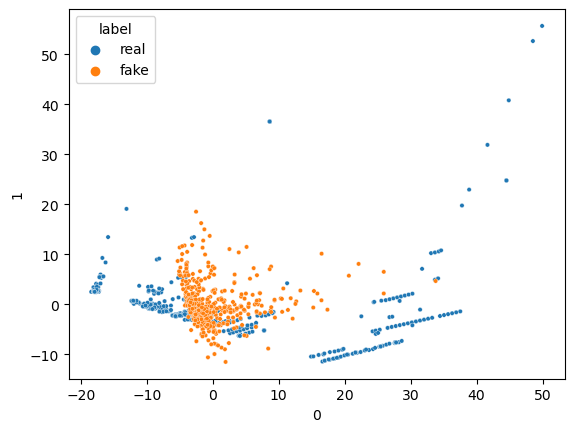

16/16 [==============================] - 0s 1ms/step


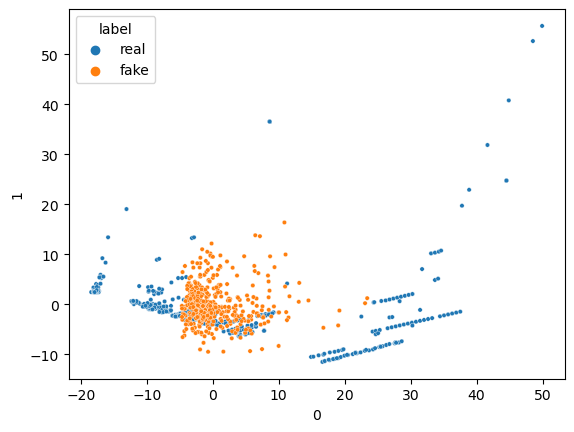

16/16 [==============================] - 0s 733us/step


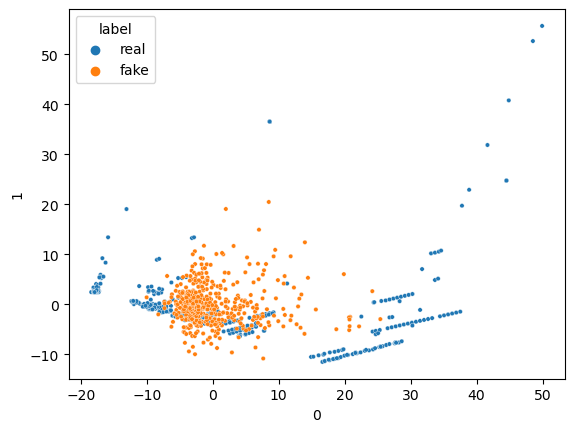

16/16 [==============================] - 0s 756us/step


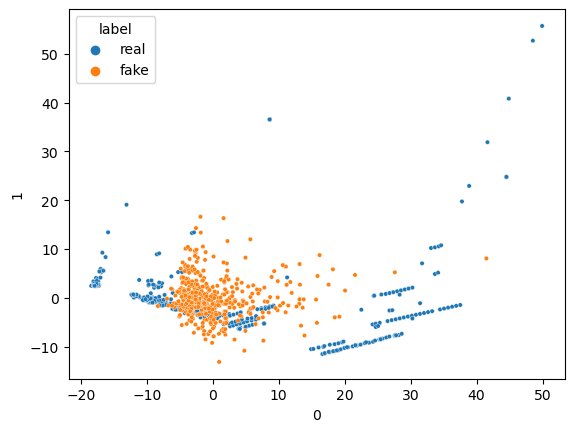

16/16 [==============================] - 0s 817us/step


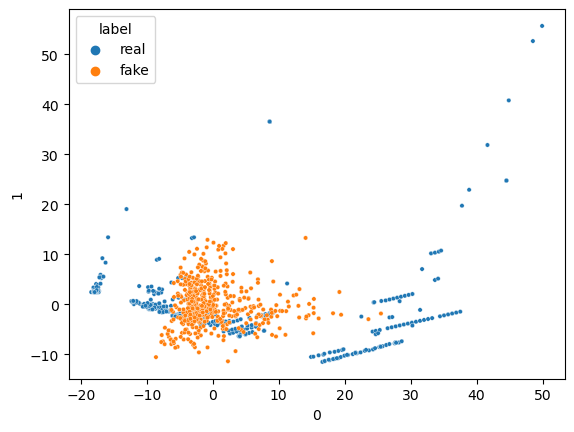

16/16 [==============================] - 0s 6ms/step


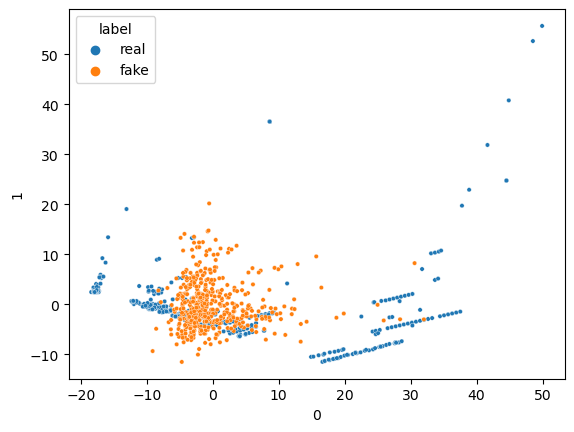

16/16 [==============================] - 0s 819us/step


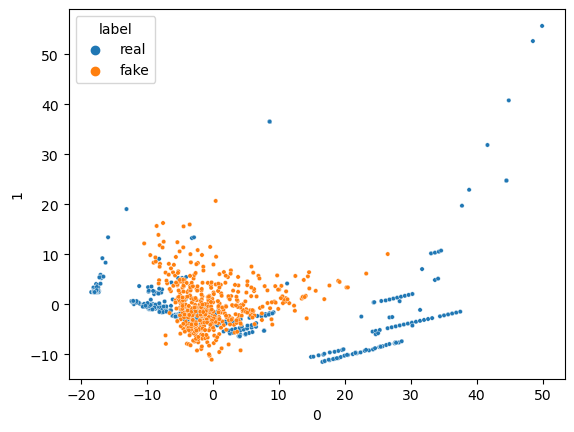

16/16 [==============================] - 0s 775us/step


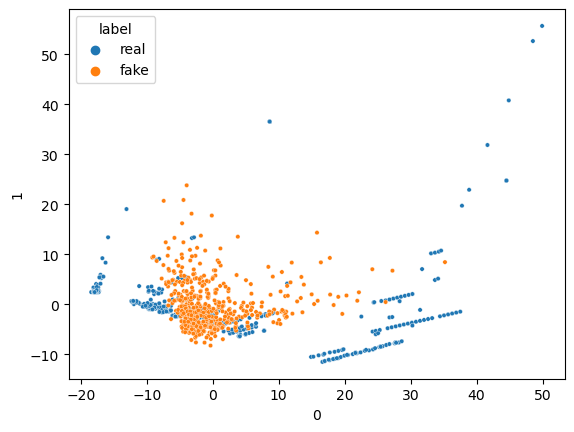

16/16 [==============================] - 0s 886us/step


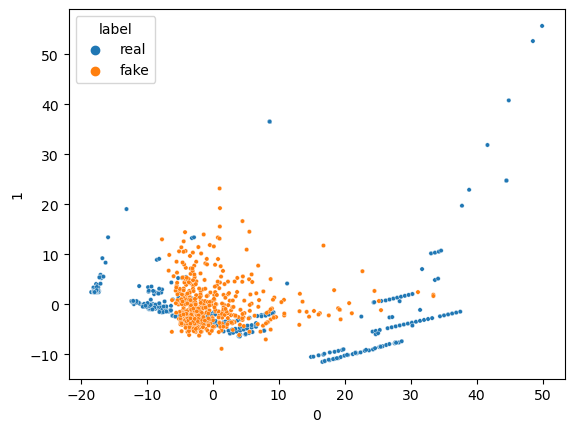

16/16 [==============================] - 0s 752us/step


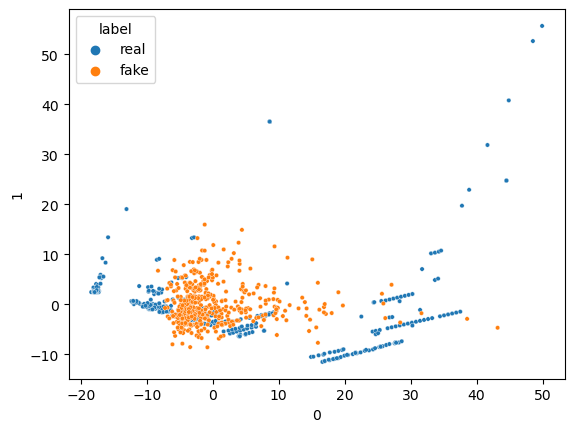

16/16 [==============================] - 0s 6ms/step


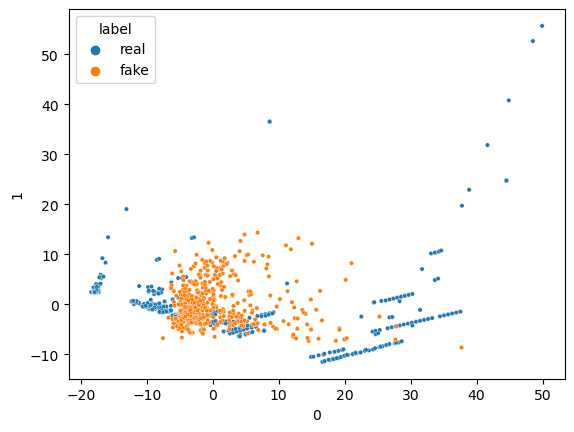

16/16 [==============================] - 0s 6ms/step


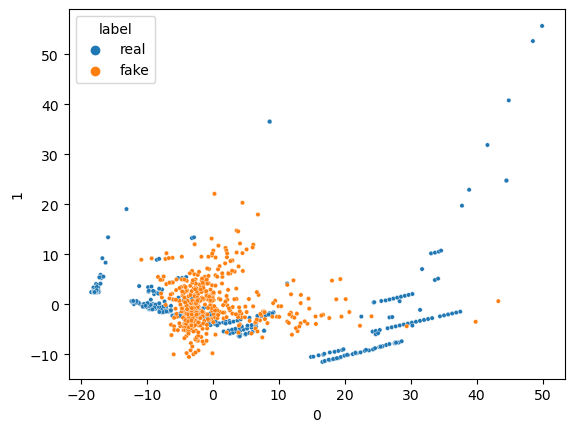

16/16 [==============================] - 0s 6ms/step


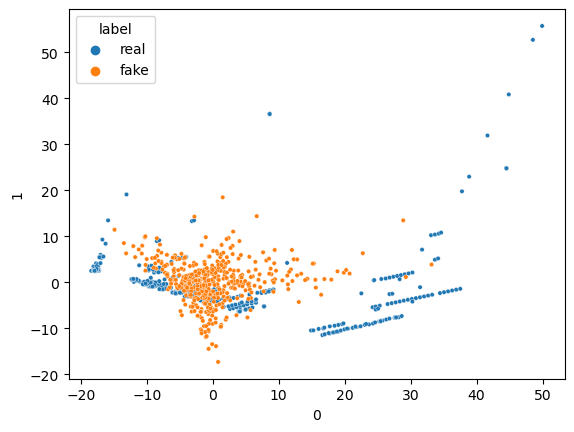

16/16 [==============================] - 0s 6ms/step


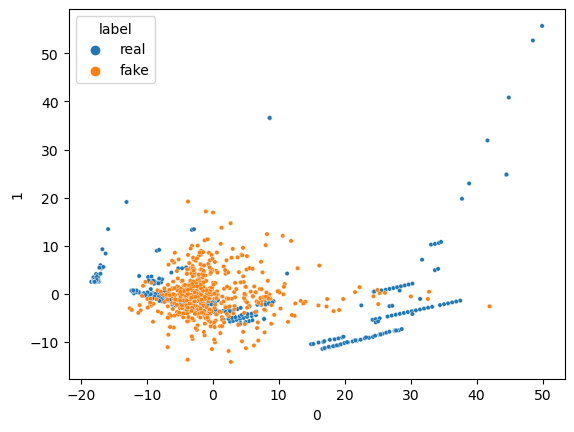

16/16 [==============================] - 0s 6ms/step


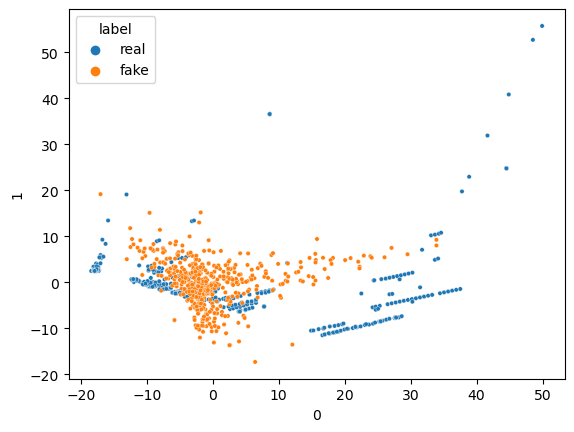

16/16 [==============================] - 0s 6ms/step


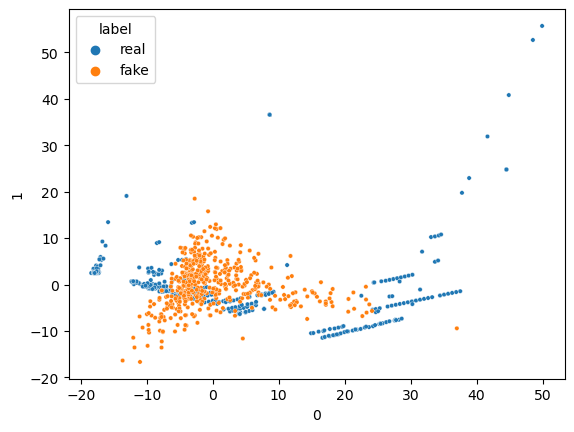

16/16 [==============================] - 0s 739us/step


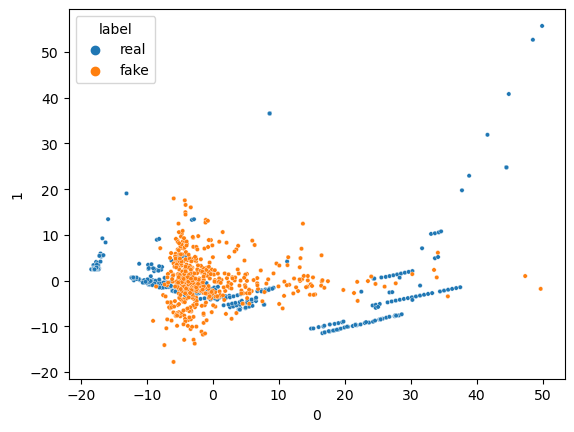

16/16 [==============================] - 0s 892us/step


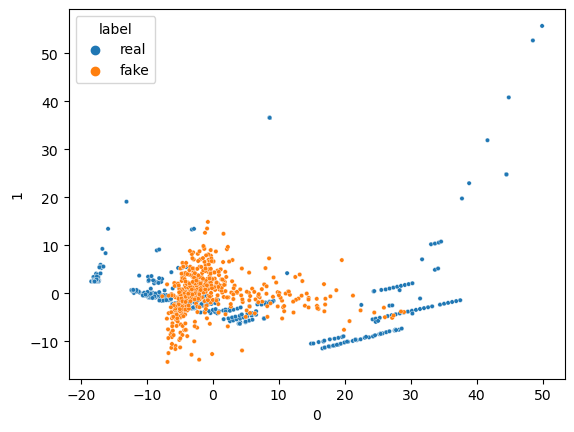

16/16 [==============================] - 0s 6ms/step


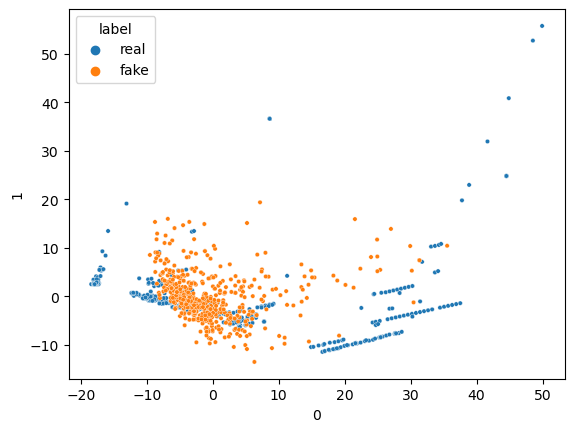

16/16 [==============================] - 0s 742us/step


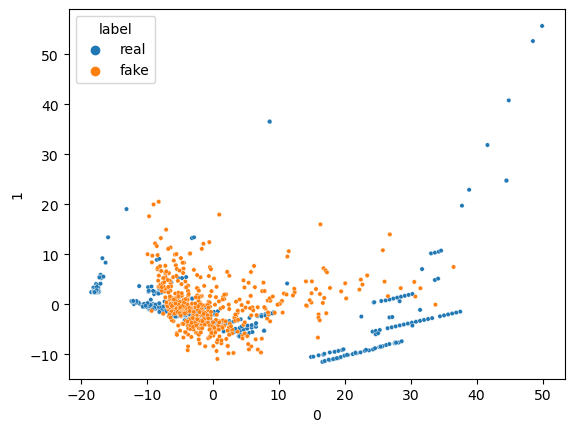

16/16 [==============================] - 0s 749us/step


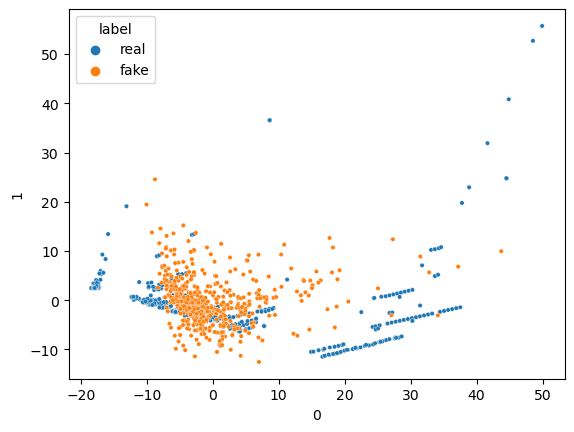

16/16 [==============================] - 0s 723us/step


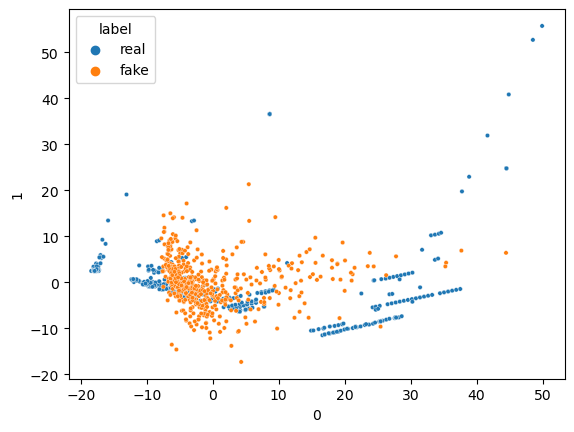

16/16 [==============================] - 0s 795us/step


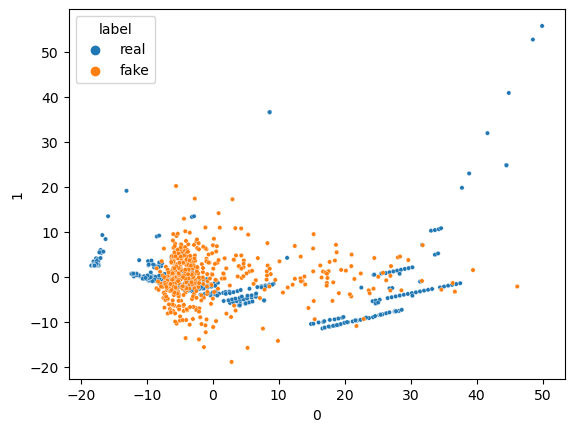

16/16 [==============================] - 0s 791us/step


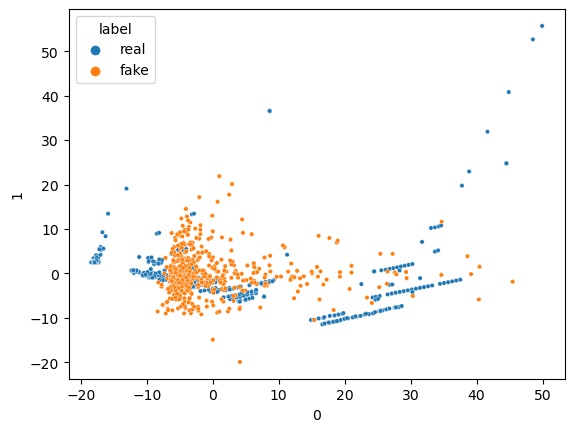

16/16 [==============================] - 0s 768us/step


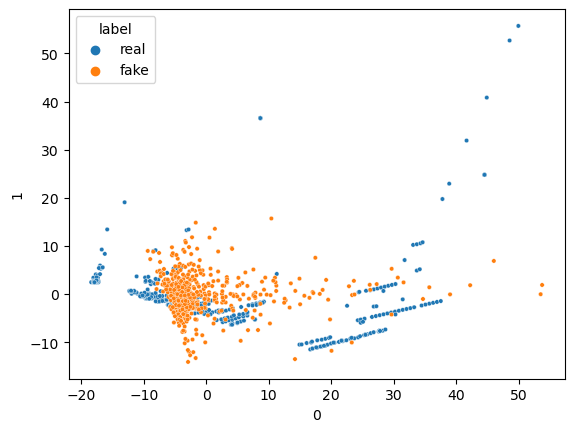

16/16 [==============================] - 0s 795us/step


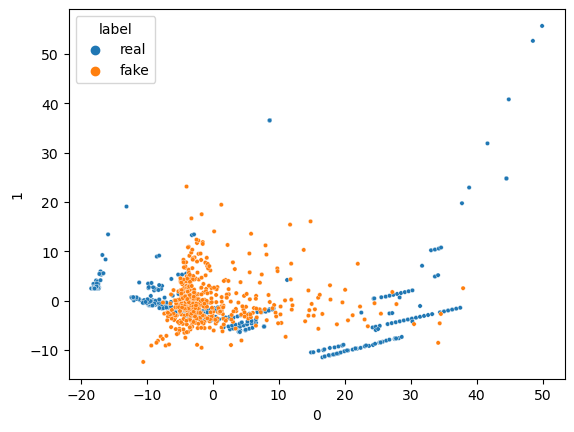

16/16 [==============================] - 0s 732us/step


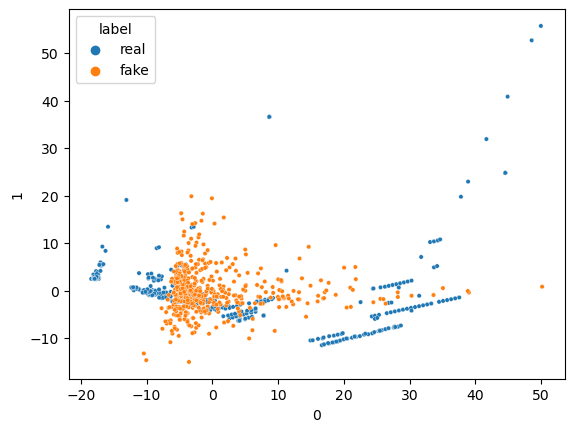

16/16 [==============================] - 0s 6ms/step


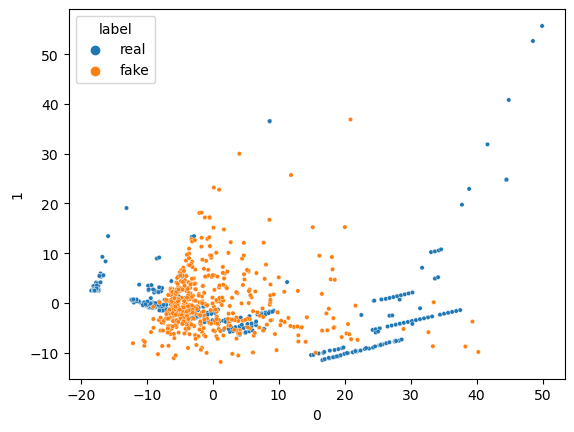

16/16 [==============================] - 0s 789us/step


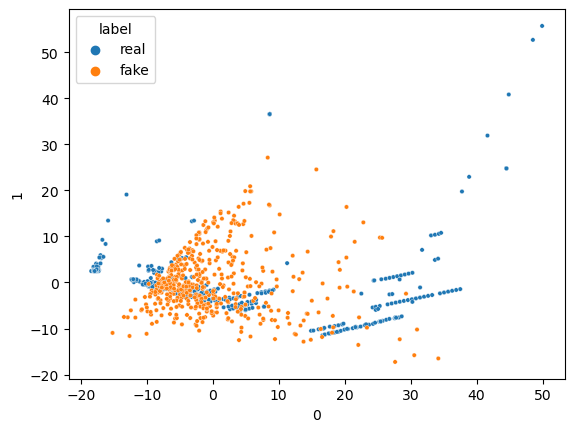

16/16 [==============================] - 0s 6ms/step


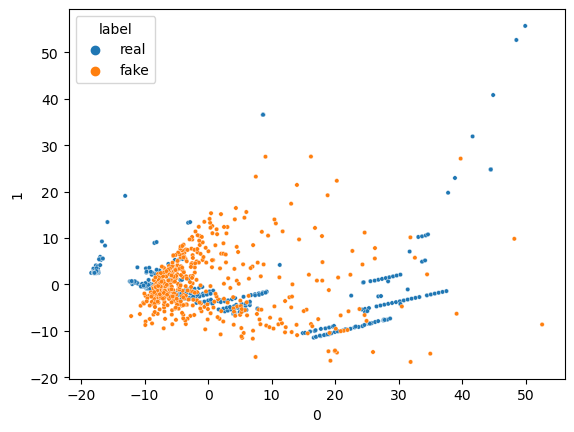

16/16 [==============================] - 0s 921us/step


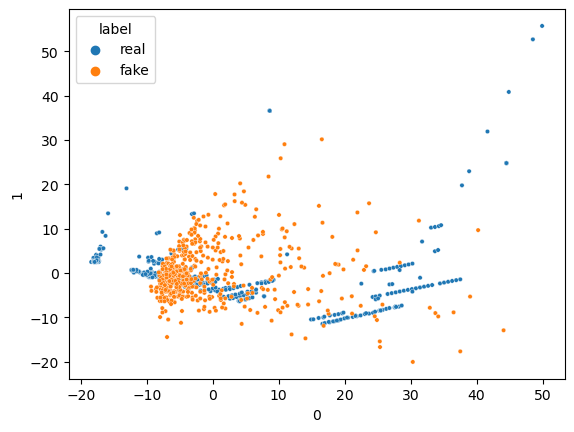

16/16 [==============================] - 0s 739us/step


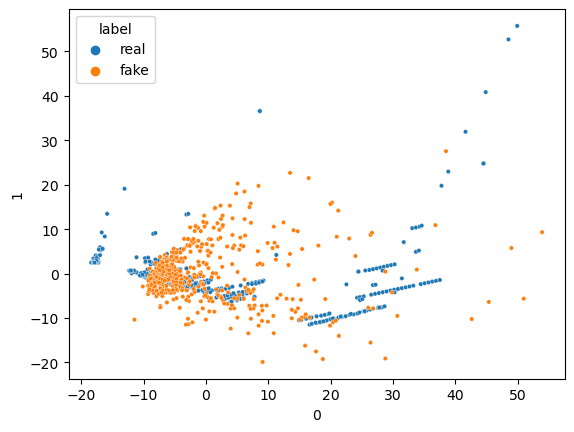

16/16 [==============================] - 0s 6ms/step


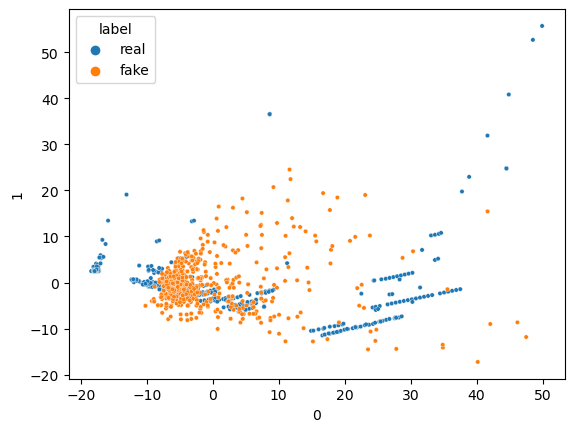

16/16 [==============================] - 0s 736us/step


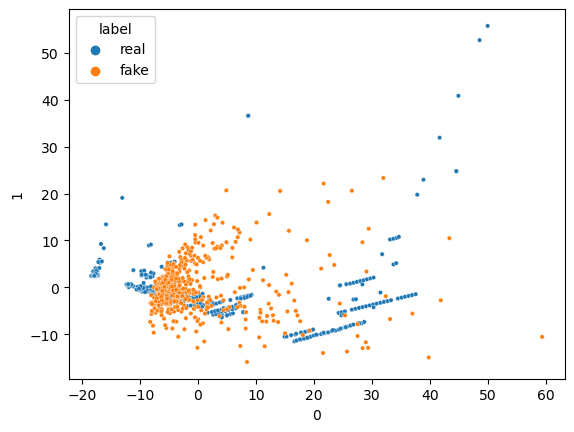

16/16 [==============================] - 0s 6ms/step


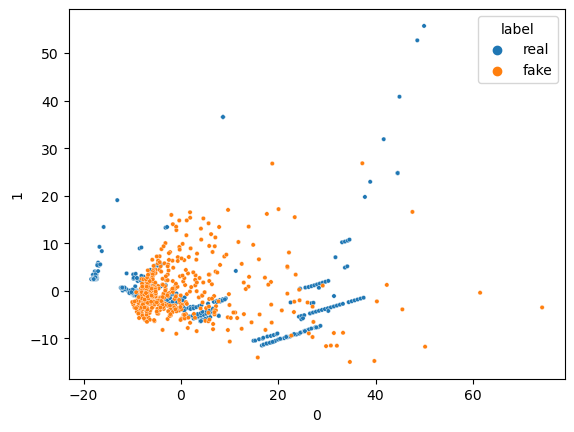

16/16 [==============================] - 0s 6ms/step


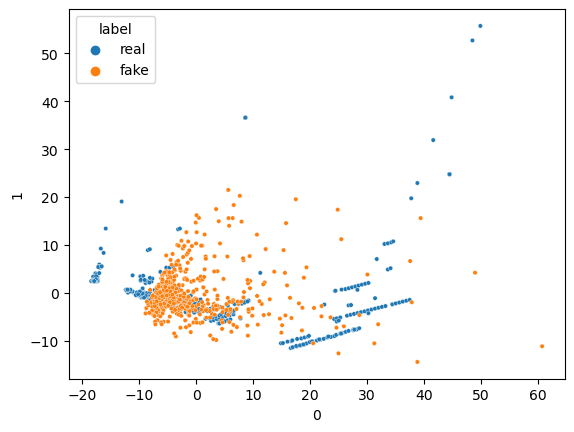

16/16 [==============================] - 0s 6ms/step


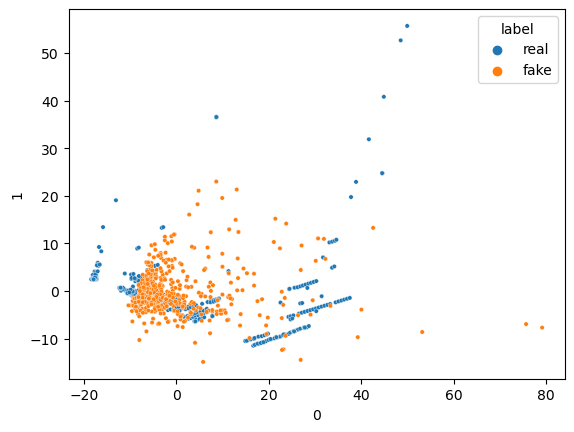

16/16 [==============================] - 0s 709us/step


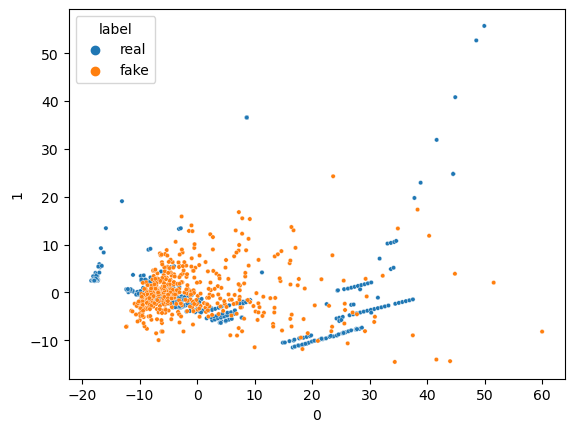

16/16 [==============================] - 0s 743us/step


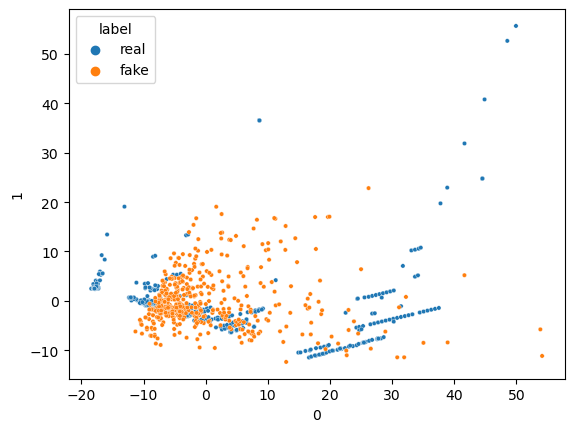

16/16 [==============================] - 0s 6ms/step


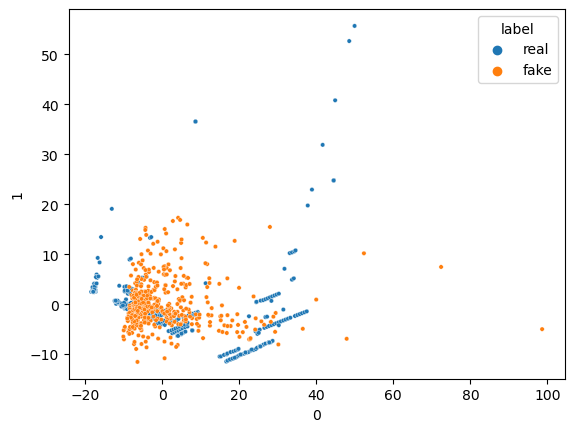

16/16 [==============================] - 0s 756us/step


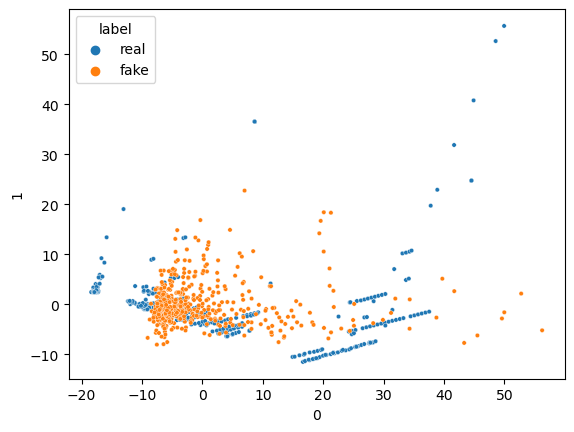

16/16 [==============================] - 0s 1ms/step


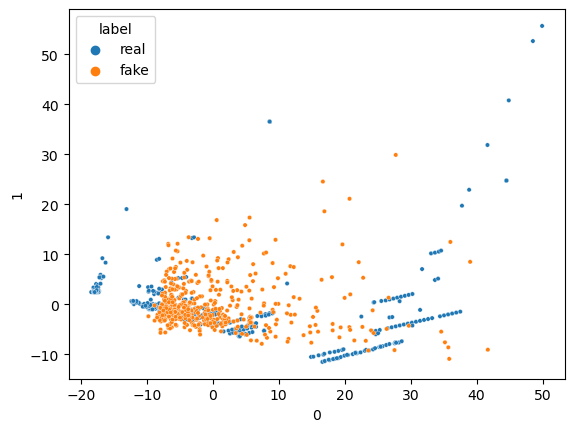

16/16 [==============================] - 0s 752us/step


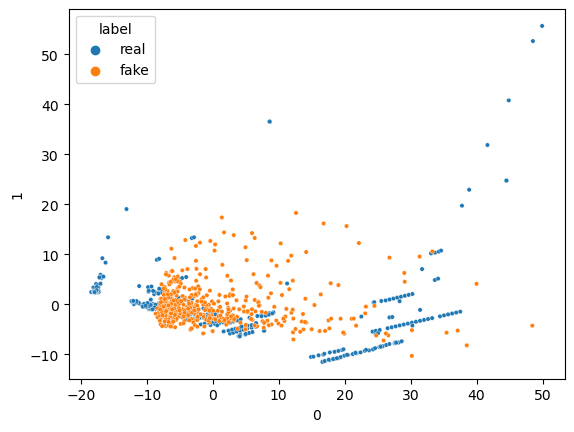

16/16 [==============================] - 0s 1ms/step


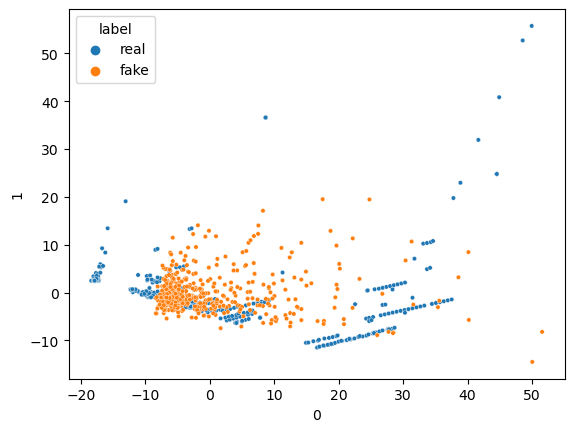

16/16 [==============================] - 0s 758us/step


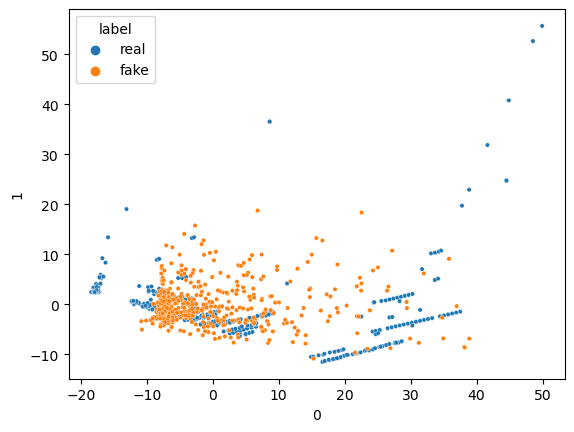

16/16 [==============================] - 0s 6ms/step


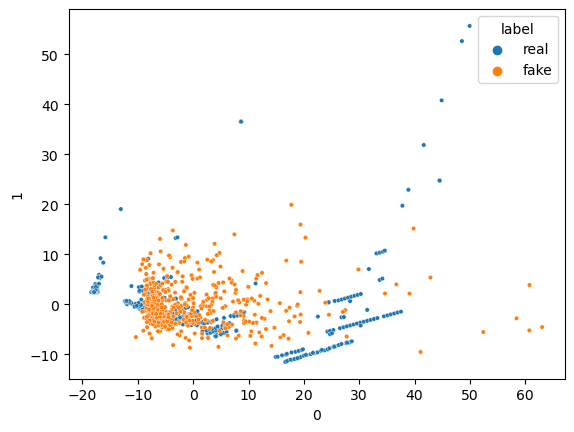

16/16 [==============================] - 0s 6ms/step


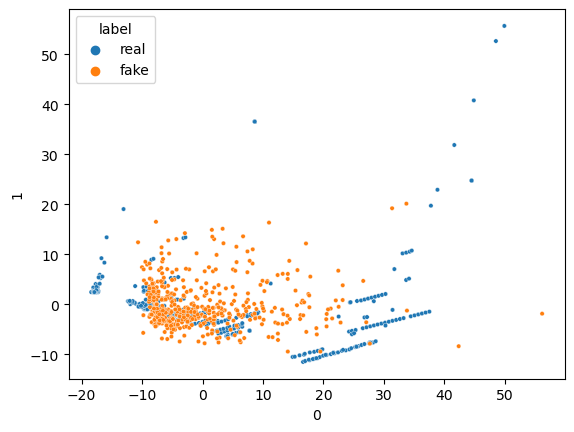

16/16 [==============================] - 0s 6ms/step


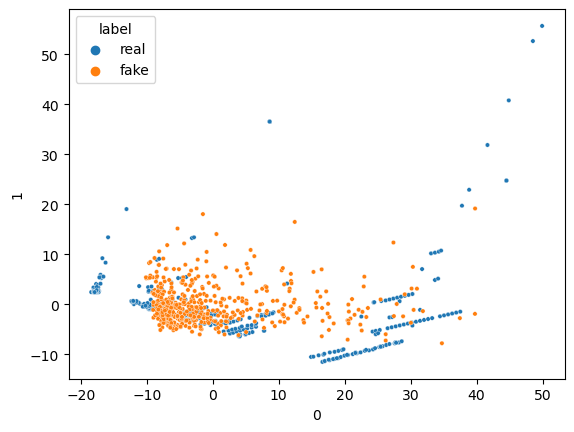

16/16 [==============================] - 0s 6ms/step


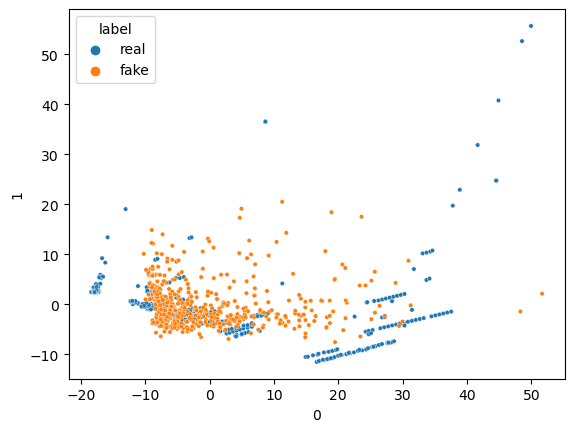

16/16 [==============================] - 0s 6ms/step


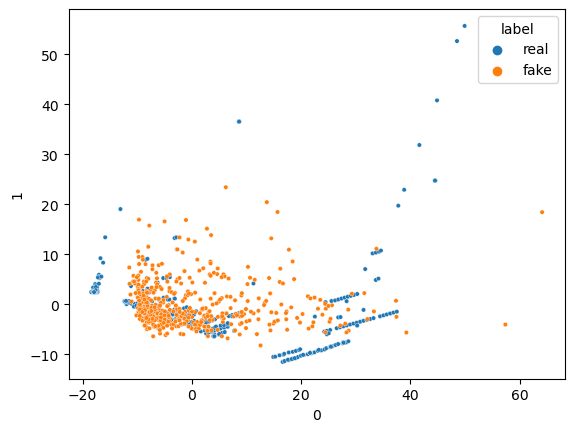

16/16 [==============================] - 0s 6ms/step


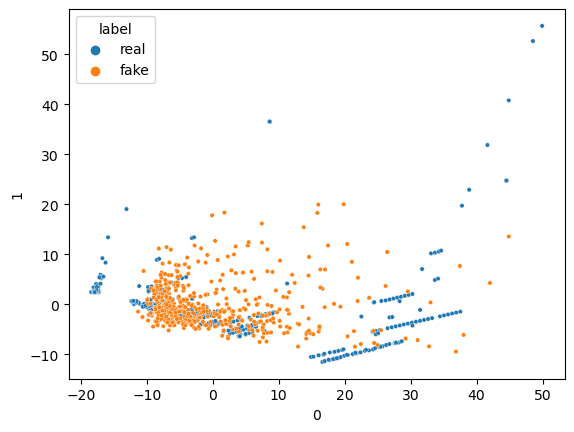

16/16 [==============================] - 0s 6ms/step


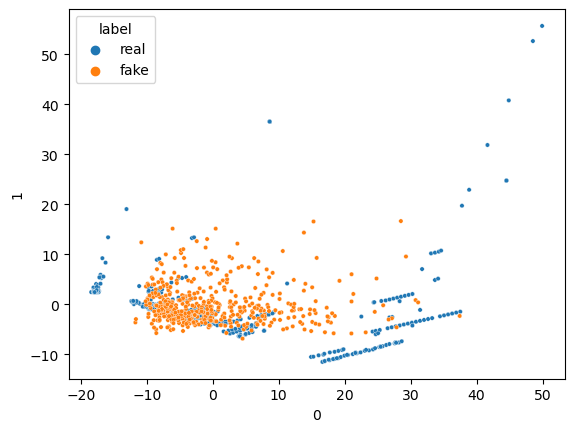

16/16 [==============================] - 0s 769us/step


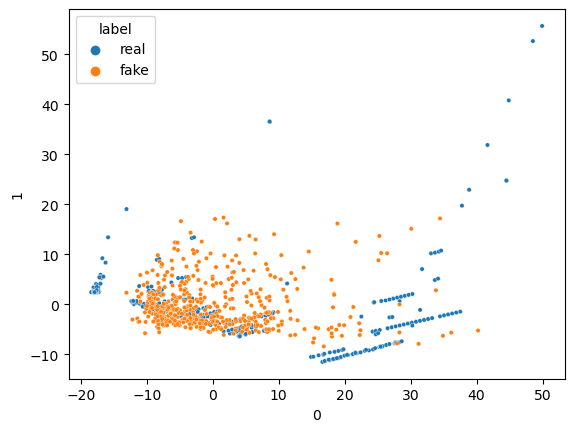

16/16 [==============================] - 0s 6ms/step


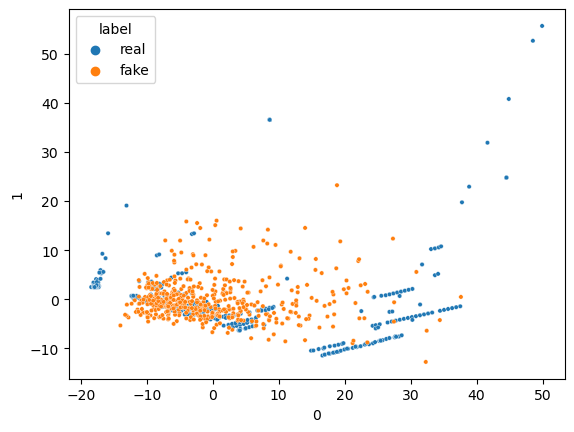

16/16 [==============================] - 0s 807us/step


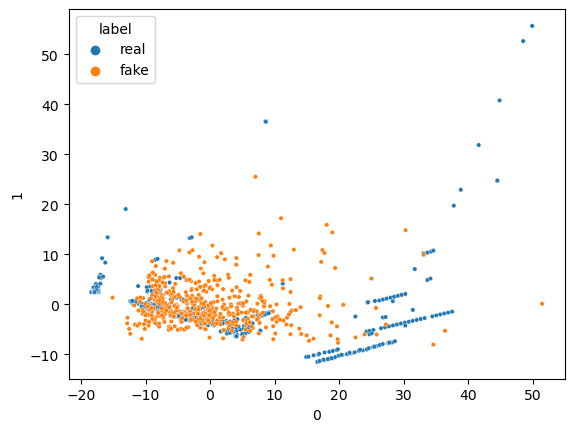

16/16 [==============================] - 0s 786us/step


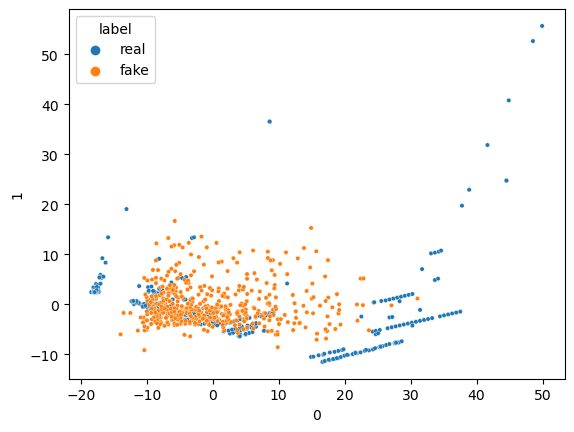

16/16 [==============================] - 0s 848us/step


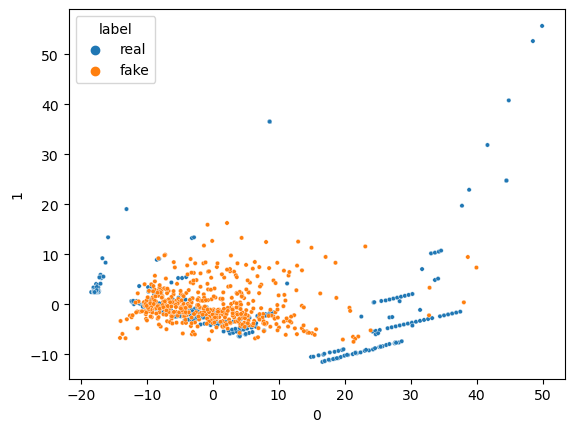

16/16 [==============================] - 0s 791us/step


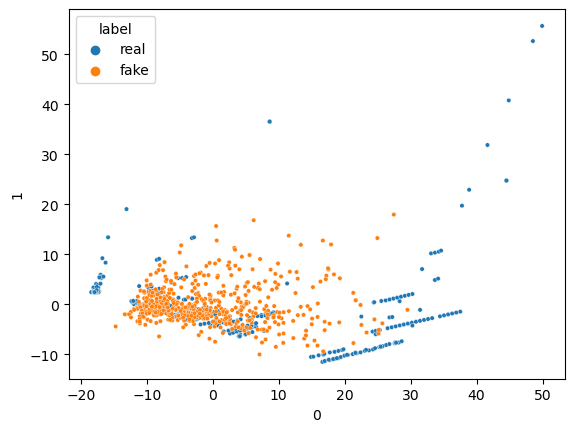

16/16 [==============================] - 0s 745us/step


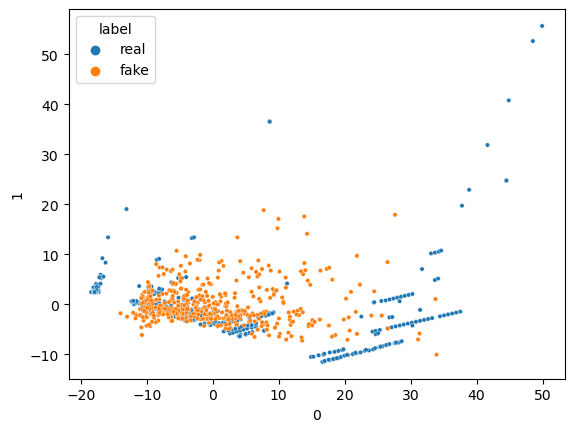

16/16 [==============================] - 0s 777us/step


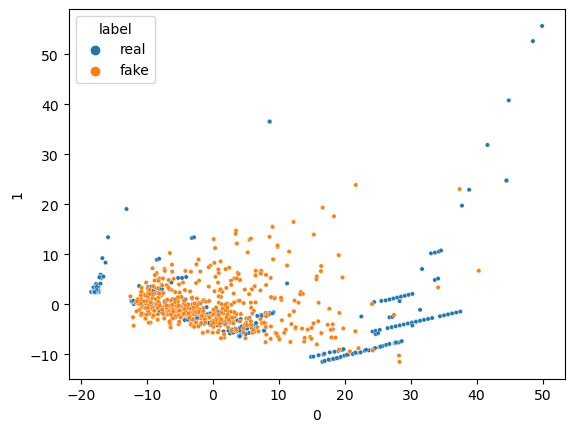

16/16 [==============================] - 0s 6ms/step


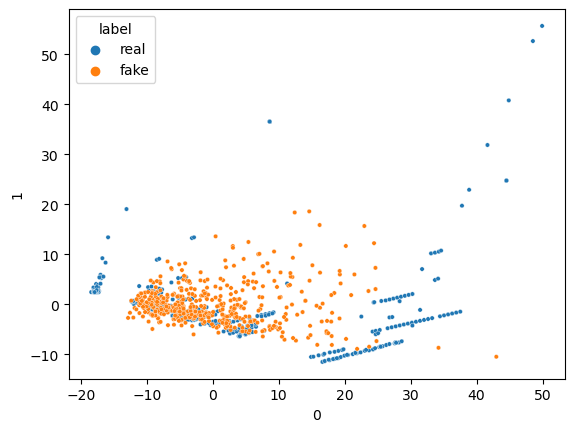

16/16 [==============================] - 0s 6ms/step


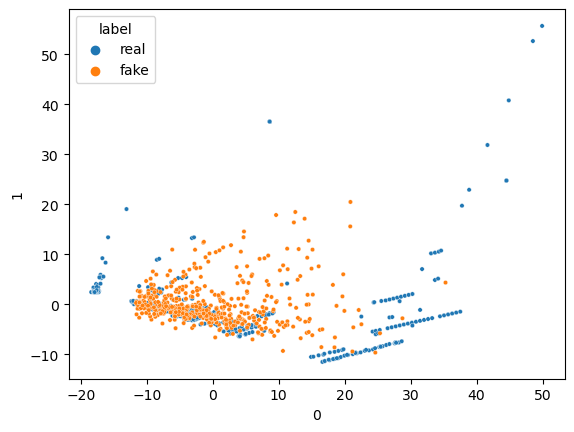

16/16 [==============================] - 0s 6ms/step


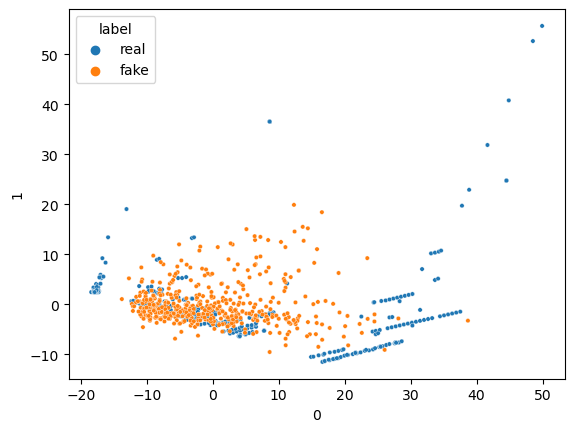

16/16 [==============================] - 0s 784us/step


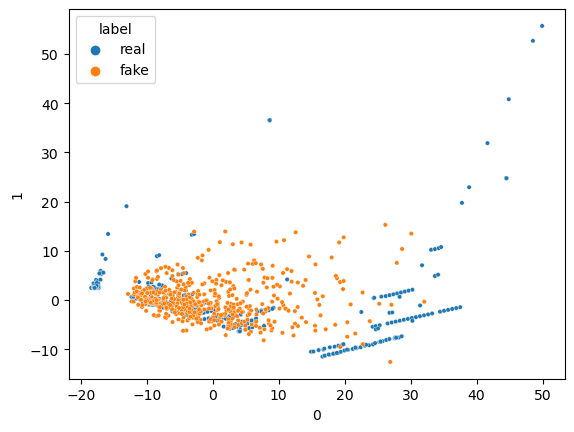

16/16 [==============================] - 0s 757us/step


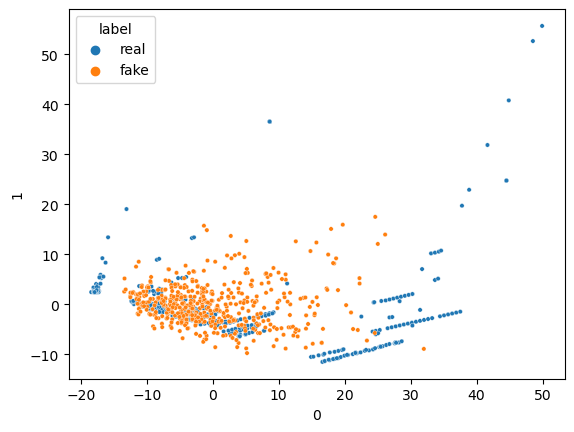

16/16 [==============================] - 0s 832us/step


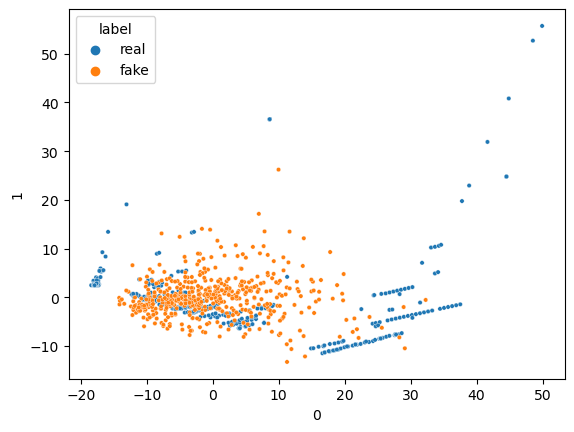

16/16 [==============================] - 0s 812us/step


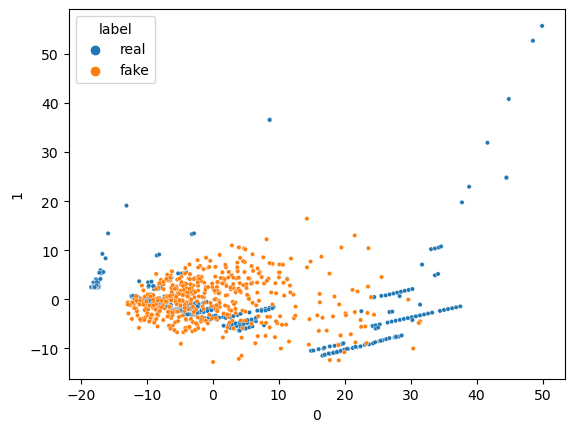

16/16 [==============================] - 0s 6ms/step


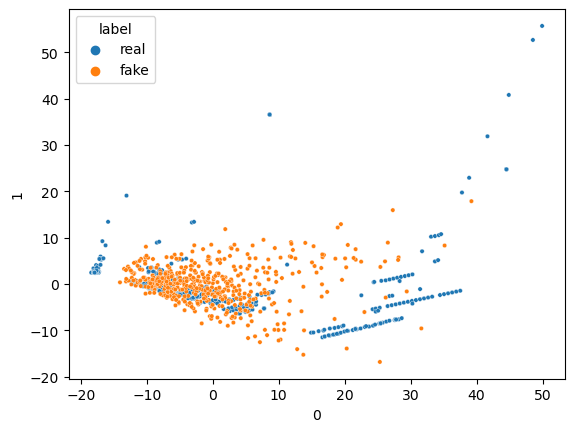

16/16 [==============================] - 0s 6ms/step


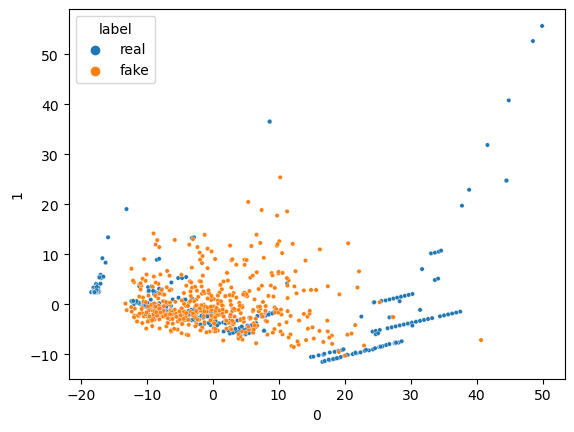

16/16 [==============================] - 0s 761us/step


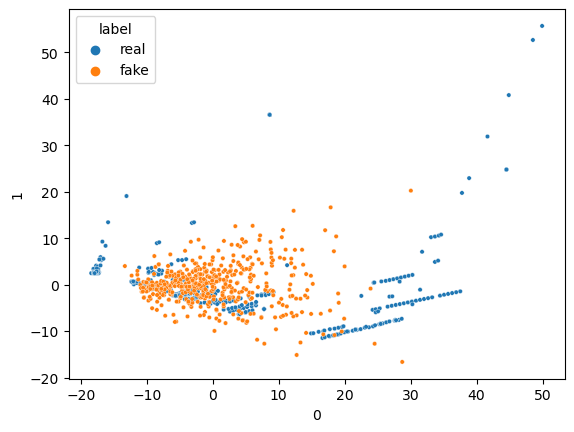

16/16 [==============================] - 0s 6ms/step


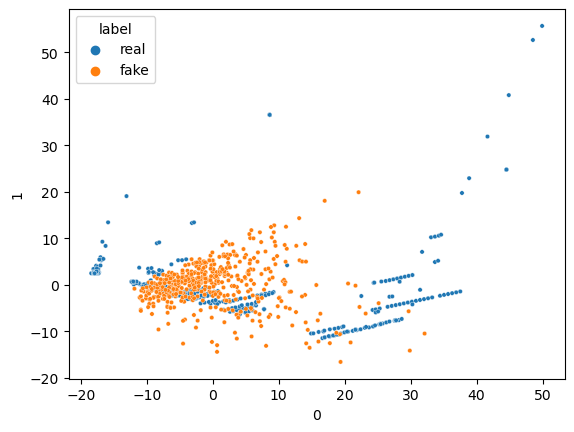

16/16 [==============================] - 0s 6ms/step


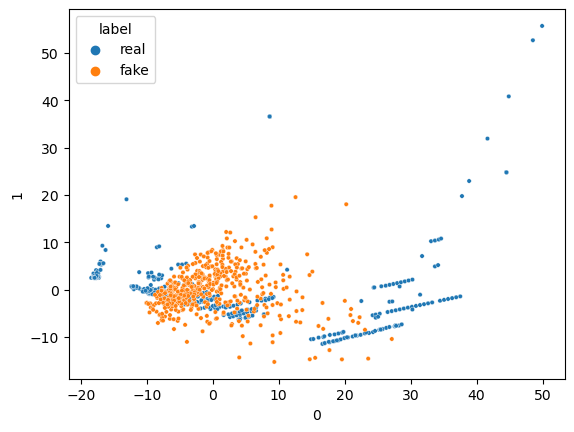

16/16 [==============================] - 0s 6ms/step


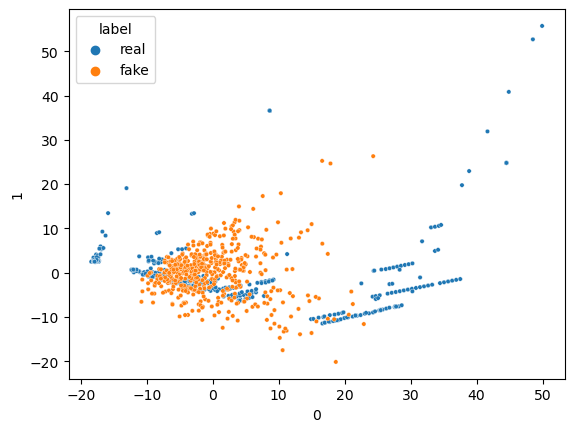

16/16 [==============================] - 0s 6ms/step


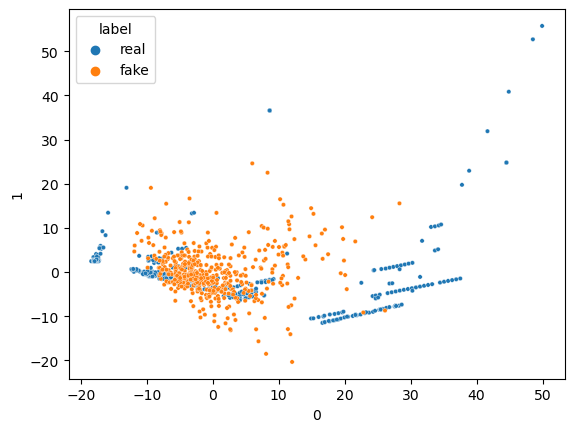

16/16 [==============================] - 0s 6ms/step


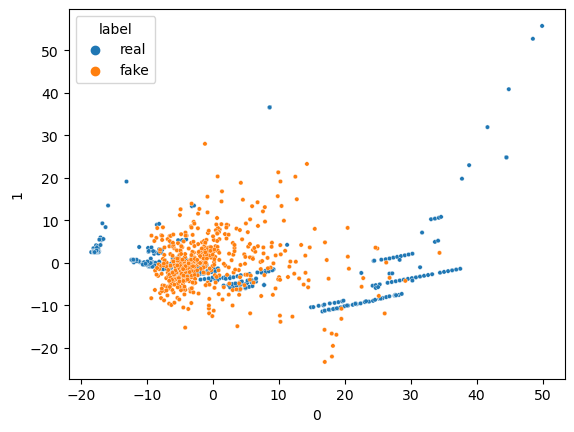

1/1 [==============================] - 0s 14ms/step


In [53]:
generator = build_generator()
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
gan.compile(optimizer = 'adam', loss = 'binary_crossentropy')

num_epochs = 1000
batch_size = 64
half_batch = int(batch_size/2)

for epoch in range(num_epochs):
    X_fake =  generate_synthetic_data(generator, half_batch)
    y_fake = np.zeros((half_batch,1))
    
    X_real = data_fraud.drop("Class", axis = 1).sample(half_batch)
    y_real = np.ones((half_batch,1))
    
    discriminator.trainable = True
    
    discriminator.train_on_batch(X_real, y_real)
    discriminator.train_on_batch(X_fake, y_fake)
    
    noise = np.random.normal(0,1,(batch_size, 29))
    gan.train_on_batch(noise,np.ones((batch_size,1)))
 
    
    if epoch%10 == 0:
        monitor_generator(generator)

### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [57]:
synthetic_data = generate_synthetic_data(generator, 1000)
df = pd.DataFrame(synthetic_data)
df['label'] = 'fake'
df2 = data_fraud.drop('Class', axis = 1)
df2['label'] = 'real'
df2.columns = df.columns


combined_df = pd.concat([df, df2])
combined_df

32/32 [==============================] - 0s 687us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-1.008123,2.883562,-6.591331,2.728745,-2.991470,-1.359517,-5.563092,0.829925,-0.954014,-6.073957,...,-0.668459,0.364020,-1.060842,-0.415867,1.222378,0.538594,1.281888,-0.741428,1.348988,fake
1,-3.311537,-0.716862,-4.930532,4.454600,1.392805,-3.650589,-2.485741,0.759144,-0.520959,-3.227633,...,0.210758,-0.435678,0.225513,-1.227081,-0.041983,0.696275,1.148334,-0.324274,-0.197085,fake
2,0.835207,2.463675,-4.236651,0.711224,-0.500386,-0.911324,-1.770150,-0.770222,0.058912,-3.339815,...,-0.086144,0.367558,0.361329,-0.068934,0.865193,0.626080,0.293810,-0.124070,0.286351,fake
3,0.848418,3.592641,-5.346947,1.679927,-2.447918,0.143116,-5.270959,0.396648,-2.073128,-6.169508,...,-1.994839,0.663645,-0.467443,-0.466783,1.308209,0.698227,1.141619,-0.368478,1.038495,fake
4,0.768399,3.314944,-4.811100,1.112453,-1.323975,-0.556846,-3.299331,-0.799372,0.029463,-3.990386,...,-0.454628,0.488045,-0.988835,0.127736,0.795737,0.650687,0.033750,-0.013385,0.676852,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [58]:
for col in combined_df.columns:
  plt.figure()
  fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
  fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>